In [1]:
!pip install nltk pandas numpy matplotlib seaborn tqdm wordcloud

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.6/27.6 MB 24.0 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 792.1/792.1 kB 35.8 MB/s eta 0:00:00
  Created wheel for wordcloud: filename=wordcloud-1.9.4-cp311-cp311-linux_aarch64.whl size=190692 sha256=2f58842e6d29311af42f4f90c0a0c815e6110d223d2730bd94bd688f7a822393
  Stored in directory: /home/jovyan/.cache/pip/wheels/1d/46/40/0e8bd59213d60c488378ff39099cc45cb114bcb6f8cdd84232
Successfully built wordcloud


In [8]:
import json
import pandas as pd
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import os
from tqdm import tqdm

# Download NLTK resources if not already available
try:
    nltk.data.find('vader_lexicon')
except LookupError:
    nltk.download('vader_lexicon')

# Initialize the sentiment analyzer
sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [9]:
def analyze_amazon_reviews(file_path):
    """
    Analyze sentiment in Amazon review JSON file.
    Returns counts of positive, negative, and neutral sentiments.
    """
    print(f"Analyzing {file_path}...")
    
    # Initialize counters
    positive = 0
    negative = 0
    neutral = 0
    total = 0
    
    # Load and process the JSON file
    try:
        with open(file_path, 'r', encoding='utf-8') as f:
            reviews = []
            for line in tqdm(f, desc="Loading reviews"):
                try:
                    review = json.loads(line.strip())
                    reviews.append(review)
                except json.JSONDecodeError:
                    continue
        
        print(f"Loaded {len(reviews)} reviews from file")
        
        # Process reviews
        for review in tqdm(reviews, desc="Analyzing sentiment"):
            # Get review text - using the specific field name for Amazon reviews
            review_text = review.get('review/text', '')
            
            if review_text:
                # Get sentiment score
                score = sid.polarity_scores(review_text)
                compound = score['compound']
                
                # Classify sentiment
                if compound >= 0.05:
                    positive += 1
                elif compound <= -0.05:
                    negative += 1
                else:
                    neutral += 1
                
                total += 1
        
        # Calculate percentages
        positive_pct = (positive / total * 100) if total > 0 else 0
        negative_pct = (negative / total * 100) if total > 0 else 0
        neutral_pct = (neutral / total * 100) if total > 0 else 0
        
        # Get category from filename
        category = os.path.basename(file_path).split('.')[0]
        
        # Create result dictionary
        result = {
            'category': category,
            'total_reviews': total,
            'positive': positive,
            'negative': negative,
            'neutral': neutral,
            'positive_pct': positive_pct,
            'negative_pct': negative_pct,
            'neutral_pct': neutral_pct
        }
        
        print(f"\nResults for {category}:")
        print(f"Total Reviews: {total}")
        print(f"Positive: {positive} ({positive_pct:.1f}%)")
        print(f"Neutral: {neutral} ({neutral_pct:.1f}%)")
        print(f"Negative: {negative} ({negative_pct:.1f}%)")
        
        return result
    
    except Exception as e:
        print(f"Error processing {file_path}: {str(e)}")
        return None

def analyze_directory(directory_path):
    """
    Analyze all JSON files in a directory and create a summary.
    """
    # Find all JSON files
    json_files = [f for f in os.listdir(directory_path) if f.endswith('.json')]
    
    if not json_files:
        print(f"No JSON files found in {directory_path}")
        return None
    
    # Process each file
    results = []
    for file_name in json_files:
        file_path = os.path.join(directory_path, file_name)
        result = analyze_amazon_reviews(file_path)
        if result:
            results.append(result)
    
    # Create summary DataFrame
    if results:
        summary_df = pd.DataFrame(results)
        
        # Sort by positive percentage
        summary_df = summary_df.sort_values('positive_pct', ascending=False)
        
        # Display summary
        print("\n=== SENTIMENT ANALYSIS SUMMARY ===")
        pd.set_option('display.max_rows', None)
        print(summary_df.to_string(index=False))
        
        # Save summary to CSV
        summary_df.to_csv("amazon_sentiment_summary.csv", index=False)
        print("\nSummary saved to amazon_sentiment_summary.csv")
        
        # Create simple bar chart if matplotlib is available
        try:
            import matplotlib.pyplot as plt
            
            plt.figure(figsize=(12, len(results) * 0.5))
            
            # Plot positive sentiment percentages
            summary_df = summary_df.sort_values('positive_pct')
            plt.barh(summary_df['category'], summary_df['positive_pct'], color='green')
            
            plt.xlabel('Positive Reviews (%)')
            plt.title('Categories by Positive Sentiment')
            plt.tight_layout()
            plt.savefig('sentiment_by_category.png')
            print("Chart saved to sentiment_by_category.png")
            
        except ImportError:
            print("Matplotlib not available, skipping chart creation")
        
        return summary_df
    
    return None

Analyzing ../data/filtered_data/Shoes.filtered.json...


Loading reviews: 3581it [00:00, 99609.40it/s]


Loaded 3581 reviews from file


Analyzing sentiment: 100%|██████████| 3581/3581 [00:00<00:00, 3597.26it/s]



Results for Shoes:
Total Reviews: 3580
Positive: 2993 (83.6%)
Neutral: 116 (3.2%)
Negative: 471 (13.2%)
Analyzing ../data/filtered_data/Gourmet_Foods.filtered.json...


Loading reviews: 97891it [00:00, 177692.87it/s]


Loaded 97891 reviews from file


Analyzing sentiment: 100%|██████████| 97891/97891 [00:28<00:00, 3488.32it/s]



Results for Gourmet_Foods:
Total Reviews: 97890
Positive: 85834 (87.7%)
Neutral: 2534 (2.6%)
Negative: 9522 (9.7%)
Analyzing ../data/filtered_data/Tools_&_Home_Improvement.filtered.json...


Loading reviews: 231206it [00:00, 240829.47it/s]


Loaded 231206 reviews from file


Analyzing sentiment: 100%|██████████| 231206/231206 [01:18<00:00, 2941.92it/s]



Results for Tools_&_Home_Improvement:
Total Reviews: 231205
Positive: 179662 (77.7%)
Neutral: 9509 (4.1%)
Negative: 42034 (18.2%)
Analyzing ../data/filtered_data/Movies_&_TV.filtered.json...


Loading reviews: 732723it [00:03, 186869.47it/s]


Loaded 732723 reviews from file


Analyzing sentiment: 100%|██████████| 732723/732723 [07:37<00:00, 1601.31it/s]



Results for Movies_&_TV:
Total Reviews: 732722
Positive: 607892 (83.0%)
Neutral: 13447 (1.8%)
Negative: 111383 (15.2%)
Analyzing ../data/filtered_data/Industrial_&_Scientific.filtered.json...


Loading reviews: 25506it [00:00, 267845.54it/s]


Loaded 25506 reviews from file


Analyzing sentiment: 100%|██████████| 25506/25506 [00:07<00:00, 3499.36it/s]



Results for Industrial_&_Scientific:
Total Reviews: 25505
Positive: 19279 (75.6%)
Neutral: 1757 (6.9%)
Negative: 4469 (17.5%)
Analyzing ../data/filtered_data/Office_Products.filtered.json...


Loading reviews: 65053it [00:00, 272680.81it/s]


Loaded 65053 reviews from file


Analyzing sentiment: 100%|██████████| 65053/65053 [00:19<00:00, 3285.36it/s]



Results for Office_Products:
Total Reviews: 65052
Positive: 52790 (81.2%)
Neutral: 2594 (4.0%)
Negative: 9668 (14.9%)
Analyzing ../data/filtered_data/Software.filtered.json...


Loading reviews: 25999it [00:00, 223589.92it/s]


Loaded 25999 reviews from file


Analyzing sentiment: 100%|██████████| 25999/25999 [00:12<00:00, 2049.28it/s]



Results for Software:
Total Reviews: 25998
Positive: 20008 (77.0%)
Neutral: 778 (3.0%)
Negative: 5212 (20.0%)
Analyzing ../data/filtered_data/Electronics.filtered.json...


Loading reviews: 340186it [00:01, 201960.62it/s]


Loaded 340186 reviews from file


Analyzing sentiment: 100%|██████████| 340186/340186 [02:07<00:00, 2675.16it/s]



Results for Electronics:
Total Reviews: 340185
Positive: 265556 (78.1%)
Neutral: 14825 (4.4%)
Negative: 59804 (17.6%)
Analyzing ../data/filtered_data/Toys_&_Games.filtered.json...


Loading reviews: 211452it [00:00, 305838.79it/s]


Loaded 211452 reviews from file


Analyzing sentiment: 100%|██████████| 211452/211452 [01:10<00:00, 2999.26it/s]



Results for Toys_&_Games:
Total Reviews: 211451
Positive: 184412 (87.2%)
Neutral: 4214 (2.0%)
Negative: 22825 (10.8%)
Analyzing ../data/filtered_data/Arts.filtered.json...


Loading reviews: 18313it [00:00, 299304.79it/s]


Loaded 18313 reviews from file


Analyzing sentiment: 100%|██████████| 18313/18313 [00:05<00:00, 3509.82it/s]



Results for Arts:
Total Reviews: 18312
Positive: 15255 (83.3%)
Neutral: 640 (3.5%)
Negative: 2417 (13.2%)
Analyzing ../data/filtered_data/Clothing_&_Accessories.filtered.json...


Loading reviews: 10758it [00:00, 282167.94it/s]


Loaded 10758 reviews from file


Analyzing sentiment: 100%|██████████| 10758/10758 [00:02<00:00, 3649.46it/s]



Results for Clothing_&_Accessories:
Total Reviews: 10757
Positive: 8876 (82.5%)
Neutral: 356 (3.3%)
Negative: 1525 (14.2%)
Analyzing ../data/filtered_data/Baby.filtered.json...


Loading reviews: 60774it [00:00, 295594.04it/s]


Loaded 60774 reviews from file


Analyzing sentiment: 100%|██████████| 60774/60774 [00:23<00:00, 2631.82it/s]



Results for Baby:
Total Reviews: 60773
Positive: 51924 (85.4%)
Neutral: 1285 (2.1%)
Negative: 7564 (12.4%)
Analyzing ../data/filtered_data/Books.filtered.json...


Loading reviews: 1126634it [00:06, 170378.56it/s]


Loaded 1126634 reviews from file


Analyzing sentiment: 100%|██████████| 1126634/1126634 [11:44<00:00, 1599.67it/s]



Results for Books:
Total Reviews: 1126633
Positive: 958601 (85.1%)
Neutral: 23601 (2.1%)
Negative: 144431 (12.8%)
Analyzing ../data/filtered_data/Video_Games.filtered.json...


Loading reviews: 156810it [00:00, 225336.58it/s]


Loaded 156810 reviews from file


Analyzing sentiment: 100%|██████████| 156810/156810 [01:43<00:00, 1511.81it/s]



Results for Video_Games:
Total Reviews: 156809
Positive: 128544 (82.0%)
Neutral: 2742 (1.7%)
Negative: 25523 (16.3%)
Analyzing ../data/filtered_data/Musical_Instruments.filtered.json...


Loading reviews: 54373it [00:00, 274872.65it/s]


Loaded 54373 reviews from file


Analyzing sentiment: 100%|██████████| 54373/54373 [00:21<00:00, 2586.11it/s]



Results for Musical_Instruments:
Total Reviews: 54372
Positive: 46609 (85.7%)
Neutral: 1543 (2.8%)
Negative: 6220 (11.4%)
Analyzing ../data/filtered_data/Music.filtered.json...


Loading reviews: 689520it [00:03, 174558.76it/s]


Loaded 689520 reviews from file


Analyzing sentiment: 100%|██████████| 689520/689520 [07:06<00:00, 1617.07it/s]



Results for Music:
Total Reviews: 689519
Positive: 628399 (91.1%)
Neutral: 11659 (1.7%)
Negative: 49461 (7.2%)
Analyzing ../data/filtered_data/Sports_&_Outdoors.filtered.json...


Loading reviews: 196970it [00:00, 306776.80it/s]


Loaded 196970 reviews from file


Analyzing sentiment: 100%|██████████| 196970/196970 [01:12<00:00, 2718.49it/s]



Results for Sports_&_Outdoors:
Total Reviews: 196969
Positive: 161618 (82.1%)
Neutral: 6390 (3.2%)
Negative: 28961 (14.7%)
Analyzing ../data/filtered_data/Cell_Phones_&_Accessories.filtered.json...


Loading reviews: 23723it [00:00, 319567.43it/s]


Loaded 23723 reviews from file


Analyzing sentiment: 100%|██████████| 23723/23723 [00:07<00:00, 3340.93it/s]



Results for Cell_Phones_&_Accessories:
Total Reviews: 23722
Positive: 16870 (71.1%)
Neutral: 1373 (5.8%)
Negative: 5479 (23.1%)
Analyzing ../data/filtered_data/Amazon_Instant_Video.filtered.json...


Loading reviews: 102103it [00:00, 196986.23it/s]


Loaded 102103 reviews from file


Analyzing sentiment: 100%|██████████| 102103/102103 [01:16<00:00, 1336.33it/s]



Results for Amazon_Instant_Video:
Total Reviews: 102102
Positive: 80515 (78.9%)
Neutral: 1930 (1.9%)
Negative: 19657 (19.3%)
Analyzing ../data/filtered_data/Patio.filtered.json...


Loading reviews: 115932it [00:00, 146802.54it/s]


Loaded 115932 reviews from file


Analyzing sentiment: 100%|██████████| 115932/115932 [00:59<00:00, 1944.23it/s]



Results for Patio:
Total Reviews: 115931
Positive: 89588 (77.3%)
Neutral: 4423 (3.8%)
Negative: 21920 (18.9%)
Analyzing ../data/filtered_data/Pet_Supplies.filtered.json...


Loading reviews: 117584it [00:00, 237317.05it/s]


Loaded 117584 reviews from file


Analyzing sentiment: 100%|██████████| 117584/117584 [00:56<00:00, 2080.04it/s]



Results for Pet_Supplies:
Total Reviews: 117583
Positive: 95599 (81.3%)
Neutral: 3546 (3.0%)
Negative: 18438 (15.7%)
Analyzing ../data/filtered_data/Kindle_Store.filtered.json...


Loading reviews: 11it [00:00, 11621.50it/s]


Loaded 11 reviews from file


Analyzing sentiment: 100%|██████████| 11/11 [00:00<00:00, 1529.04it/s]



Results for Kindle_Store:
Total Reviews: 10
Positive: 9 (90.0%)
Neutral: 0 (0.0%)
Negative: 1 (10.0%)
Analyzing ../data/filtered_data/Jewelry.filtered.json...


Loading reviews: 22862it [00:00, 286070.26it/s]


Loaded 22862 reviews from file


Analyzing sentiment: 100%|██████████| 22862/22862 [00:06<00:00, 3591.11it/s]



Results for Jewelry:
Total Reviews: 22861
Positive: 20143 (88.1%)
Neutral: 559 (2.4%)
Negative: 2159 (9.4%)
Analyzing ../data/filtered_data/Automotive.filtered.json...


Loading reviews: 122187it [00:00, 137319.91it/s]


Loaded 122187 reviews from file


Analyzing sentiment: 100%|██████████| 122187/122187 [00:53<00:00, 2295.82it/s]



Results for Automotive:
Total Reviews: 122186
Positive: 96013 (78.6%)
Neutral: 5301 (4.3%)
Negative: 20872 (17.1%)
Analyzing ../data/filtered_data/Health.filtered.json...


Loading reviews: 211388it [00:01, 110722.60it/s]


Loaded 211388 reviews from file


Analyzing sentiment: 100%|██████████| 211388/211388 [02:09<00:00, 1632.37it/s]



Results for Health:
Total Reviews: 211387
Positive: 165698 (78.4%)
Neutral: 7864 (3.7%)
Negative: 37825 (17.9%)
Analyzing ../data/filtered_data/Watches.filtered.json...


Loading reviews: 22713it [00:00, 108817.96it/s]


Loaded 22713 reviews from file


Analyzing sentiment: 100%|██████████| 22713/22713 [00:15<00:00, 1474.11it/s]



Results for Watches:
Total Reviews: 22712
Positive: 19277 (84.9%)
Neutral: 643 (2.8%)
Negative: 2792 (12.3%)
Analyzing ../data/filtered_data/Home_&_Kitchen.filtered.json...


Loading reviews: 409426it [00:03, 103231.85it/s]


Loaded 409426 reviews from file


Analyzing sentiment: 100%|██████████| 409426/409426 [04:03<00:00, 1678.87it/s]



Results for Home_&_Kitchen:
Total Reviews: 409425
Positive: 339849 (83.0%)
Neutral: 11967 (2.9%)
Negative: 57609 (14.1%)
Analyzing ../data/filtered_data/Beauty.filtered.json...


Loading reviews: 119483it [00:00, 248454.45it/s]


Loaded 119483 reviews from file


Analyzing sentiment: 100%|██████████| 119483/119483 [01:01<00:00, 1927.56it/s]



Results for Beauty:
Total Reviews: 119482
Positive: 100800 (84.4%)
Neutral: 3754 (3.1%)
Negative: 14928 (12.5%)

=== SENTIMENT ANALYSIS SUMMARY ===
                 category  total_reviews  positive  negative  neutral  positive_pct  negative_pct  neutral_pct
                    Music         689519    628399     49461    11659     91.135850      7.173261     1.690889
             Kindle_Store             10         9         1        0     90.000000     10.000000     0.000000
                  Jewelry          22861     20143      2159      559     88.110756      9.444031     2.445212
            Gourmet_Foods          97890     85834      9522     2534     87.684135      9.727245     2.588620
             Toys_&_Games         211451    184412     22825     4214     87.212640     10.794463     1.992897
      Musical_Instruments          54372     46609      6220     1543     85.722431     11.439712     2.837858
                     Baby          60773     51924      7564     1285     

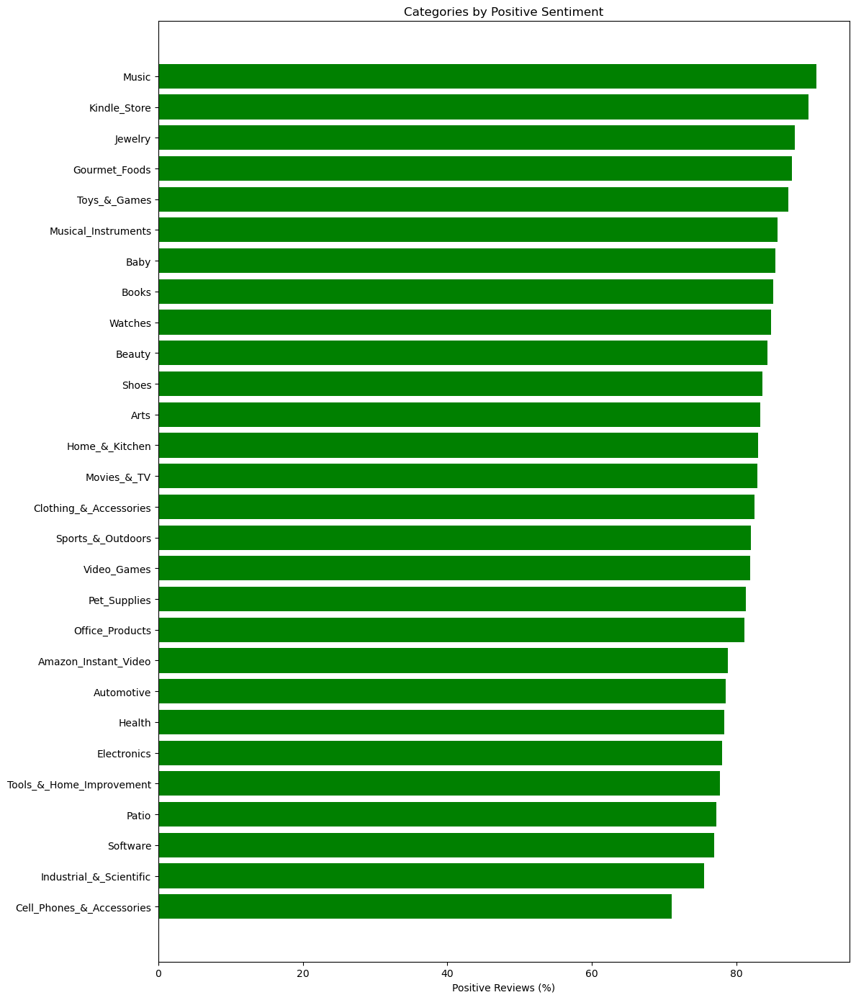

In [10]:
summary = analyze_directory('../data/filtered_data')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/justintan/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Looking for JSON files in ../data/filtered_data...
Found 28 JSON files

Processing Shoes...


Reading Shoes: 3581it [00:00, 30592.22it/s]


Word cloud saved to wordclouds/Shoes_wordcloud.png


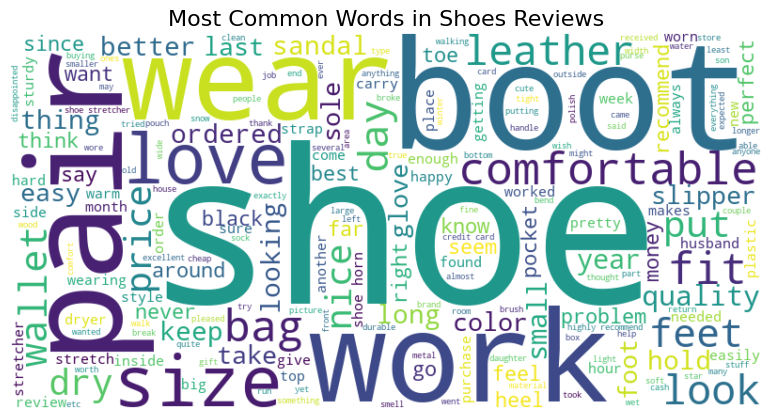

Completed Shoes: 3580 reviews, 242844 words
Top 10 words: shoes (1909), shoe (1307), great (1116), boots (925), pair (891), like (865), well (816), use (715), size (708), good (686)

Processing Gourmet_Foods...


Reading Gourmet_Foods: 97891it [00:02, 35078.11it/s]


Word cloud saved to wordclouds/Gourmet_Foods_wordcloud.png


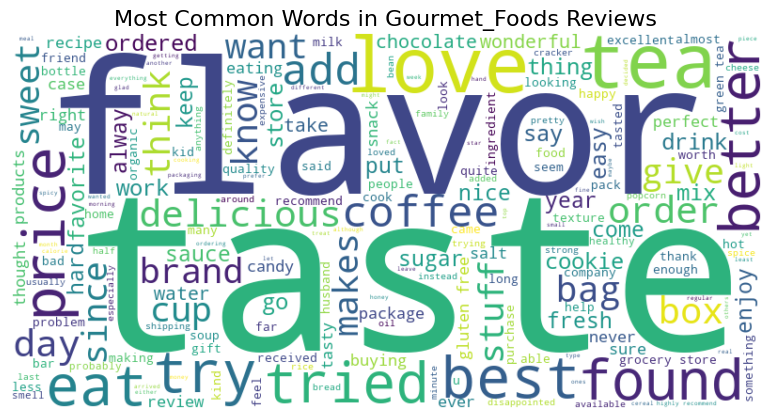

Completed Gourmet_Foods: 97890 reviews, 6932803 words
Top 10 words: like (36590), tea (33701), good (32465), great (28463), taste (27154), flavor (22733), love (19251), get (15743), use (15167), really (14520)

Processing Tools_&_Home_Improvement...


Reading Tools_&_Home_Improvement: 231206it [00:07, 30792.24it/s]


Word cloud saved to wordclouds/Tools_&_Home_Improvement_wordcloud.png


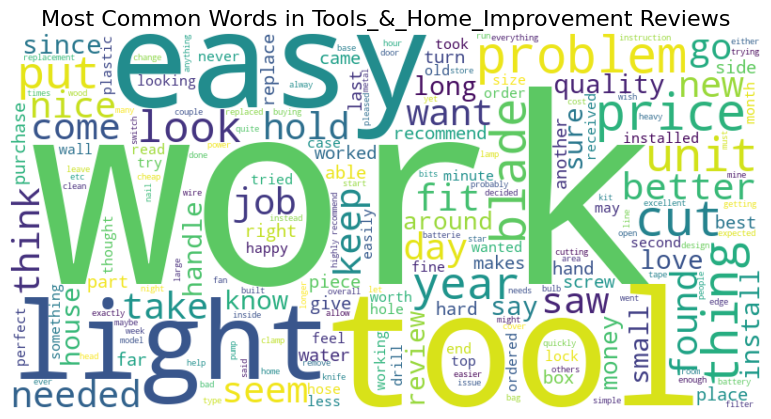

Completed Tools_&_Home_Improvement: 231205 reviews, 19748966 words
Top 10 words: use (78113), great (65522), well (58376), good (56157), like (53919), get (49607), used (46035), time (44294), work (43602), easy (39348)

Processing Movies_&_TV...


Reading Movies_&_TV: 732723it [01:02, 11695.67it/s]


Word cloud saved to wordclouds/Movies_&_TV_wordcloud.png


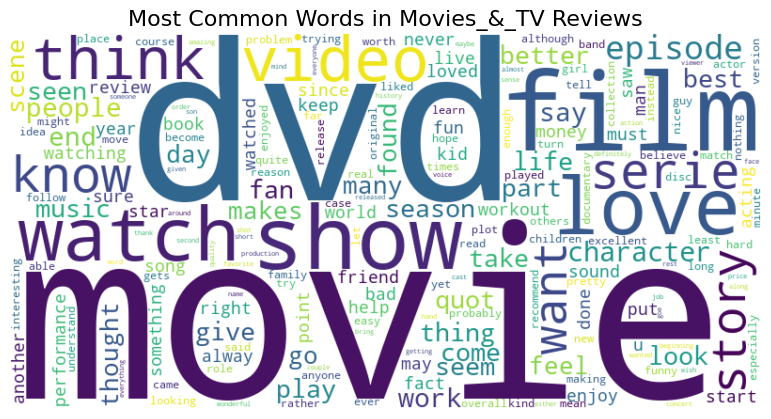

Completed Movies_&_TV: 732722 reviews, 106256565 words
Top 10 words: movie (426124), dvd (395129), film (354026), like (328749), great (292734), good (288994), time (228766), well (204881), really (202029), get (198857)

Processing Industrial_&_Scientific...


Reading Industrial_&_Scientific: 25506it [00:01, 19284.00it/s]


Word cloud saved to wordclouds/Industrial_&_Scientific_wordcloud.png


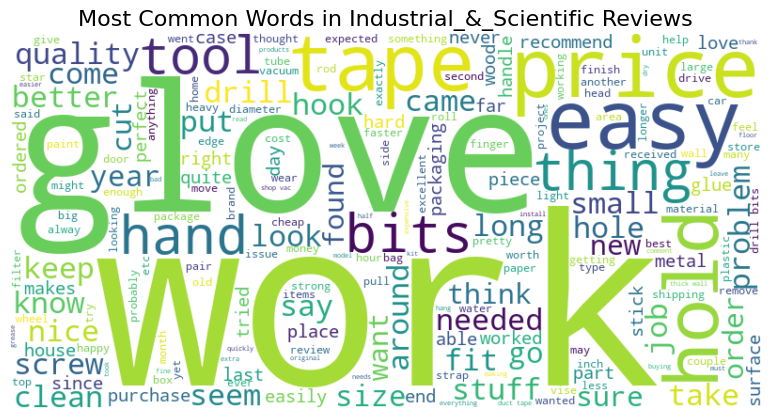

Completed Industrial_&_Scientific: 25505 reviews, 1806644 words
Top 10 words: use (7584), well (6237), great (6236), good (5952), used (5381), like (5237), work (4725), get (4261), bit (4216), tape (4097)

Processing Office_Products...


Reading Office_Products: 65053it [00:03, 18803.90it/s]


Word cloud saved to wordclouds/Office_Products_wordcloud.png


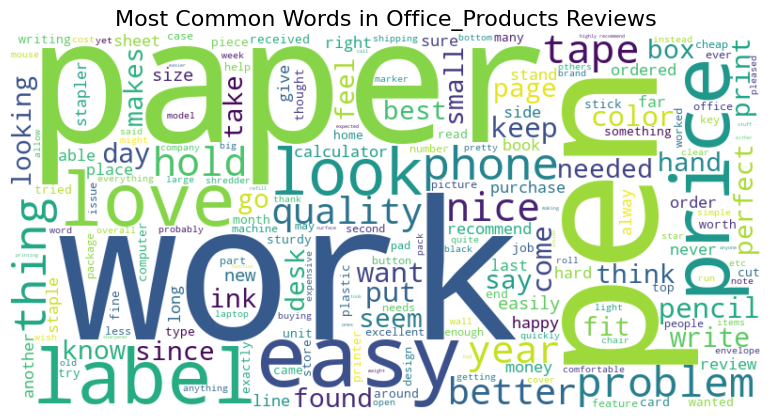

Completed Office_Products: 65052 reviews, 4971736 words
Top 10 words: use (24517), great (18934), like (16375), paper (16193), good (15034), well (14300), get (11553), time (11323), used (11050), pen (10713)

Processing Software...


Reading Software: 25999it [00:01, 14039.17it/s]


Word cloud saved to wordclouds/Software_wordcloud.png


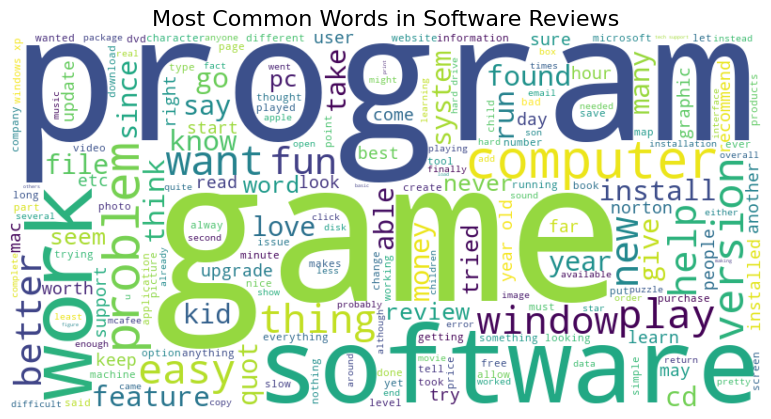

Completed Software: 25998 reviews, 3191765 words
Top 10 words: software (13448), game (13296), program (11963), use (9777), get (9427), like (8858), time (8415), computer (7650), version (7020), great (6665)

Processing Electronics...


Reading Electronics: 340186it [00:19, 17610.78it/s]


Word cloud saved to wordclouds/Electronics_wordcloud.png


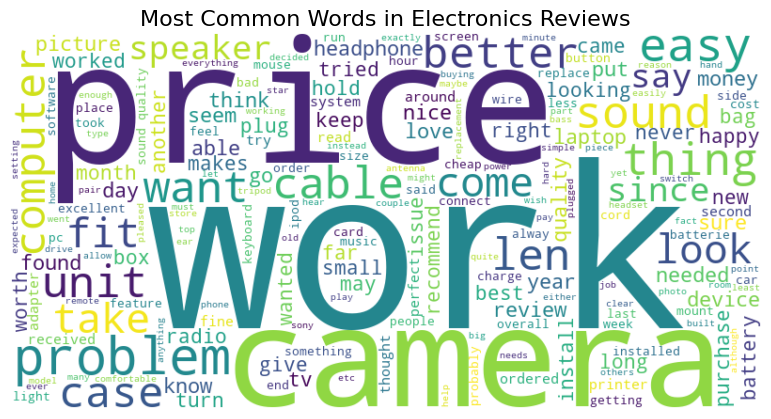

Completed Electronics: 340185 reviews, 30468193 words
Top 10 words: great (113741), use (110711), good (100896), like (80321), get (80118), well (77605), works (68949), quality (65763), camera (63851), sound (63714)

Processing Toys_&_Games...


Reading Toys_&_Games: 211452it [00:12, 17105.23it/s]


Word cloud saved to wordclouds/Toys_&_Games_wordcloud.png


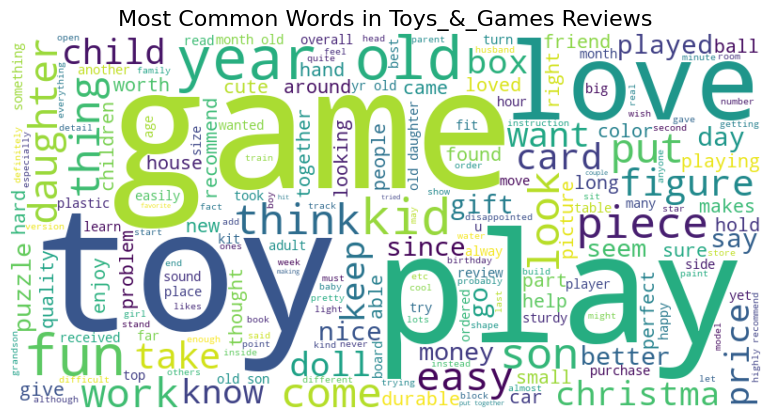

Completed Toys_&_Games: 211451 reviews, 17192352 words
Top 10 words: game (75118), old (69053), great (68015), toy (67534), like (56390), play (51372), year (50611), fun (49276), little (46576), get (46078)

Processing Arts...


Reading Arts: 18313it [00:01, 15511.51it/s]


Word cloud saved to wordclouds/Arts_wordcloud.png


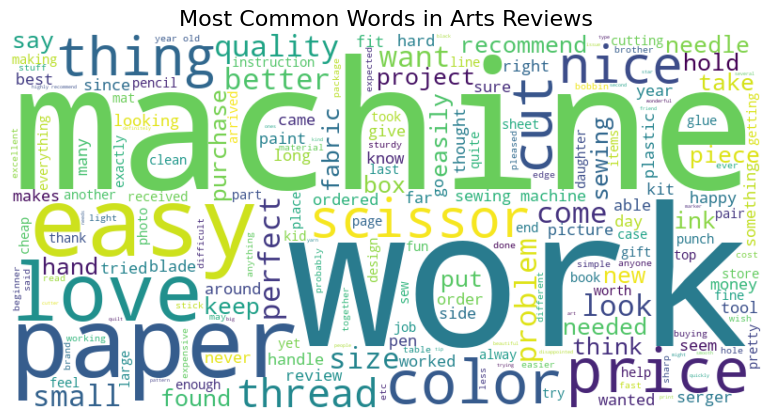

Completed Arts: 18312 reviews, 1283742 words
Top 10 words: use (6687), great (5484), machine (4608), like (3989), good (3840), well (3676), paper (3659), get (3382), easy (3342), used (3319)

Processing Clothing_&_Accessories...


Reading Clothing_&_Accessories: 10758it [00:00, 24080.73it/s]


Word cloud saved to wordclouds/Clothing_&_Accessories_wordcloud.png


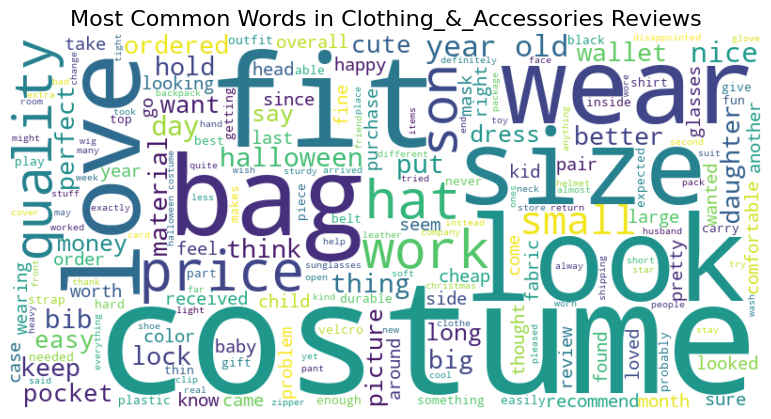

Completed Clothing_&_Accessories: 10757 reviews, 721833 words
Top 10 words: costume (3618), great (2921), like (2811), well (2391), good (2256), little (1842), old (1834), size (1816), fit (1755), made (1701)

Processing Baby...


Reading Baby: 60774it [00:03, 18370.87it/s]


Word cloud saved to wordclouds/Baby_wordcloud.png


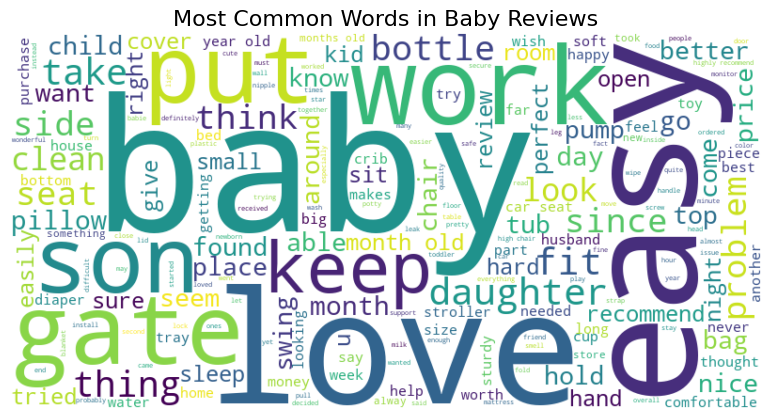

Completed Baby: 60773 reviews, 5780299 words
Top 10 words: baby (30512), use (22560), great (21518), like (17678), get (16173), easy (15499), little (14594), old (13991), well (13677), time (13376)

Processing Books...


Reading Books: 1126634it [01:31, 12253.84it/s]


Word cloud saved to wordclouds/Books_wordcloud.png


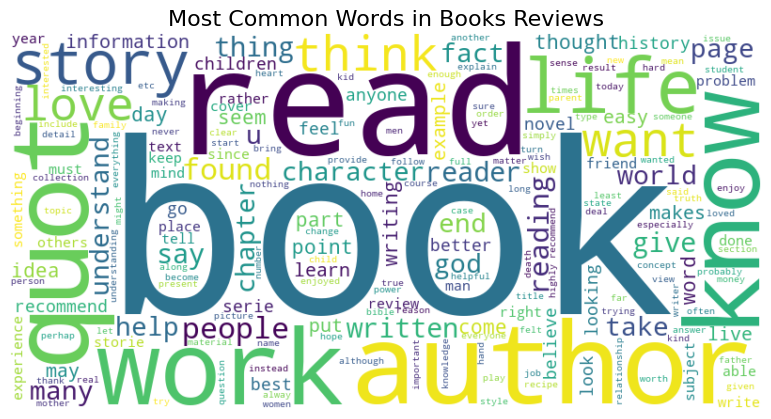

Completed Books: 1126633 reviews, 166231366 words
Top 10 words: book (2174715), read (606737), like (383137), quot (350752), good (332020), well (324582), great (315569), many (303593), time (292825), also (292389)

Processing Video_Games...


Reading Video_Games: 156810it [00:13, 11901.29it/s]


Word cloud saved to wordclouds/Video_Games_wordcloud.png


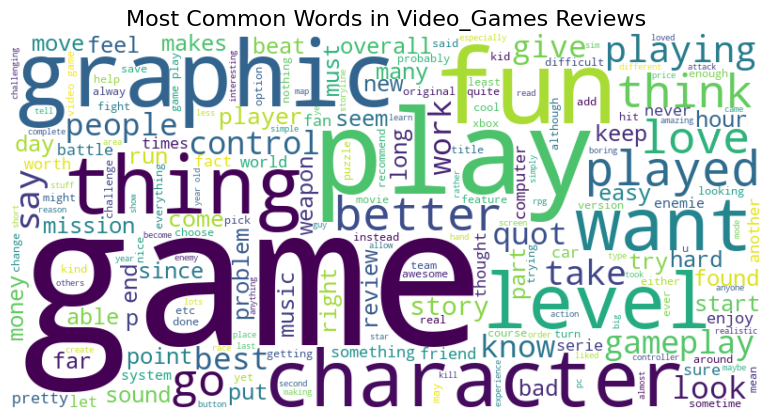

Completed Video_Games: 156809 reviews, 24294905 words
Top 10 words: game (476313), like (111468), games (97348), get (93294), play (87996), good (71775), fun (71056), great (66755), time (64209), really (59980)

Processing Musical_Instruments...


Reading Musical_Instruments: 54373it [00:02, 18290.87it/s]


Word cloud saved to wordclouds/Musical_Instruments_wordcloud.png


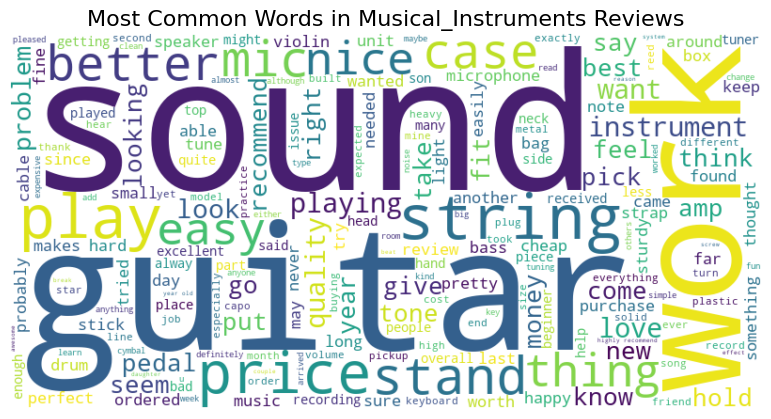

Completed Musical_Instruments: 54372 reviews, 4696486 words
Top 10 words: great (20937), guitar (20445), sound (20122), good (18602), like (15930), use (14615), well (14082), get (12830), price (10962), strings (10562)

Processing Music...


Reading Music: 689520it [00:47, 14540.43it/s]


Word cloud saved to wordclouds/Music_wordcloud.png


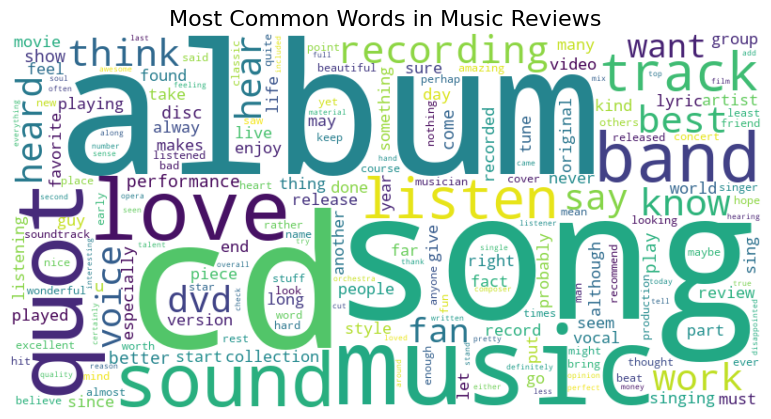

Completed Music: 689519 reviews, 96409469 words
Top 10 words: music (496212), album (495882), quot (468850), like (399717), songs (330937), great (323676), song (282111), good (260828), love (205701), first (199632)

Processing Sports_&_Outdoors...


Reading Sports_&_Outdoors: 196970it [00:07, 27792.23it/s]


Word cloud saved to wordclouds/Sports_&_Outdoors_wordcloud.png


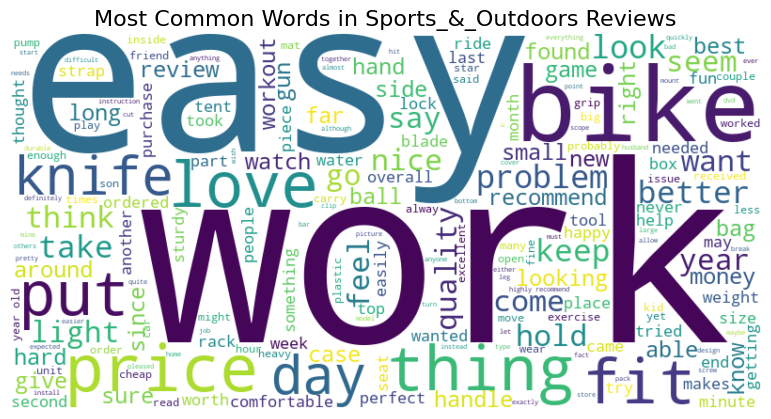

Completed Sports_&_Outdoors: 196969 reviews, 17068403 words
Top 10 words: great (67486), use (58082), good (55331), like (53692), get (48345), well (48223), time (37306), bike (33605), easy (33589), really (32505)

Processing Cell_Phones_&_Accessories...


Reading Cell_Phones_&_Accessories: 23723it [00:00, 31868.19it/s]


Word cloud saved to wordclouds/Cell_Phones_&_Accessories_wordcloud.png


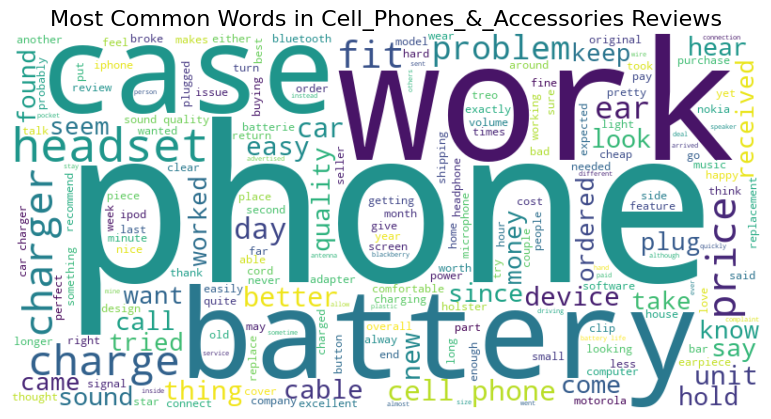

Completed Cell_Phones_&_Accessories: 23722 reviews, 1688188 words
Top 10 words: phone (16876), battery (8112), great (6651), use (6351), good (5911), works (5635), headset (5246), case (5172), like (4901), charger (4874)

Processing Amazon_Instant_Video...


Reading Amazon_Instant_Video: 102103it [00:05, 17301.57it/s]


Word cloud saved to wordclouds/Amazon_Instant_Video_wordcloud.png


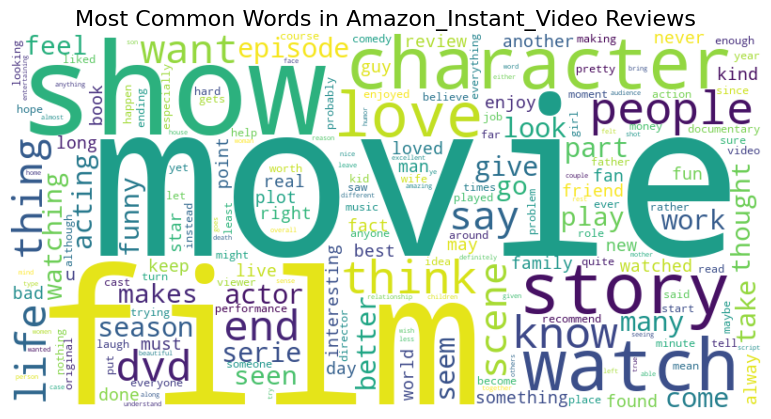

Completed Amazon_Instant_Video: 102102 reviews, 13593959 words
Top 10 words: movie (104737), film (72236), like (44867), good (38801), great (32661), story (31933), really (29001), well (28082), time (27449), see (27065)

Processing Patio...


Reading Patio: 115932it [00:04, 27880.36it/s]


Word cloud saved to wordclouds/Patio_wordcloud.png


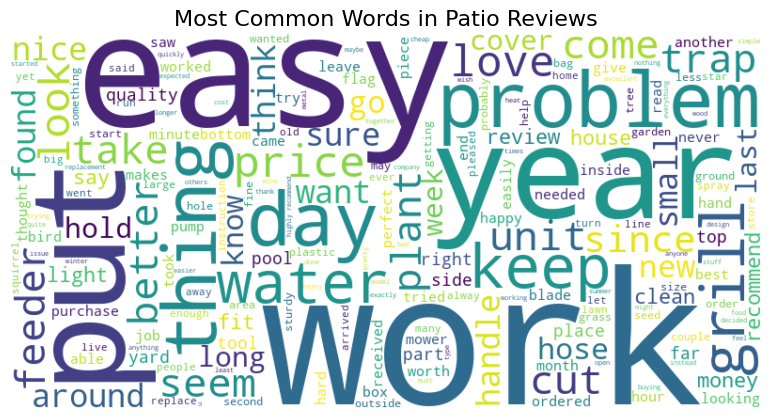

Completed Patio: 115931 reviews, 9773001 words
Top 10 words: use (34261), great (32288), well (28795), get (26970), like (26226), good (24719), time (23423), easy (21691), used (20229), little (16844)

Processing Pet_Supplies...


Reading Pet_Supplies: 117584it [00:04, 28940.58it/s]


Word cloud saved to wordclouds/Pet_Supplies_wordcloud.png


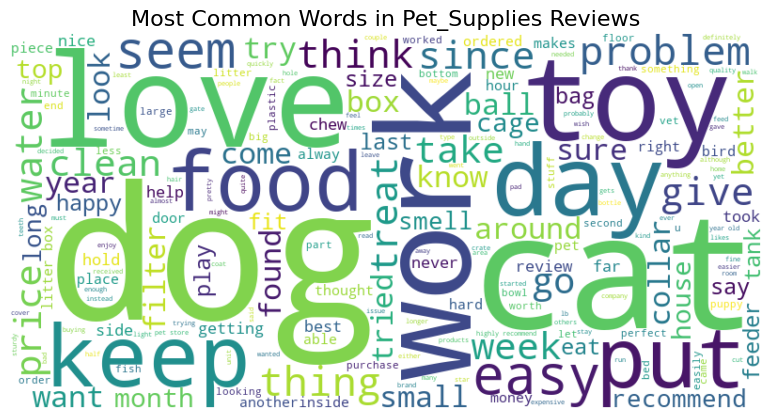

Completed Pet_Supplies: 117583 reviews, 10255937 words
Top 10 words: dog (54321), cat (34134), like (32773), get (31072), great (30757), use (27061), dogs (25276), well (24558), time (22492), food (22478)

Processing Kindle_Store...


Reading Kindle_Store: 11it [00:00, 11247.52it/s]


Word cloud saved to wordclouds/Kindle_Store_wordcloud.png


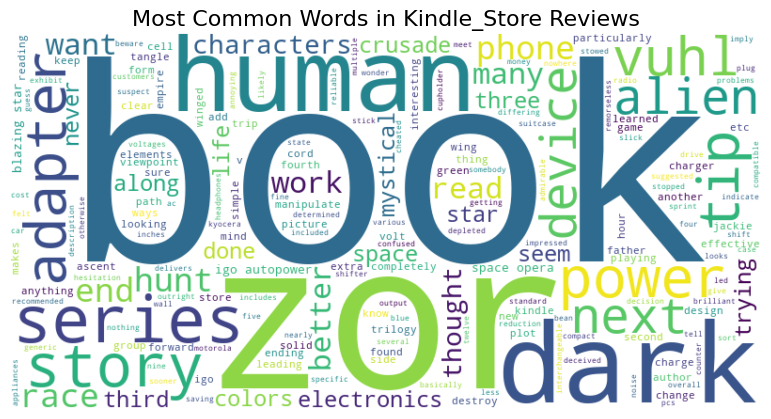

Completed Kindle_Store: 10 reviews, 1527 words
Top 10 words: book (16), zor (12), dark (11), series (11), humans (10), story (9), adapter (7), books (7), vuhl (7), first (6)

Processing Jewelry...


Reading Jewelry: 22862it [00:00, 41512.09it/s]


Word cloud saved to wordclouds/Jewelry_wordcloud.png


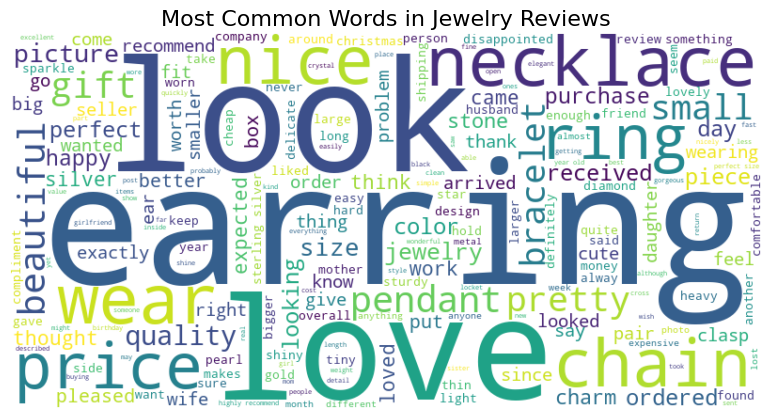

Completed Jewelry: 22861 reviews, 1160019 words
Top 10 words: earrings (6266), great (5010), like (4940), nice (4517), chain (3947), love (3814), good (3754), necklace (3572), gift (3557), wear (3510)

Processing Automotive...


Reading Automotive: 122187it [00:03, 32749.42it/s]


Word cloud saved to wordclouds/Automotive_wordcloud.png


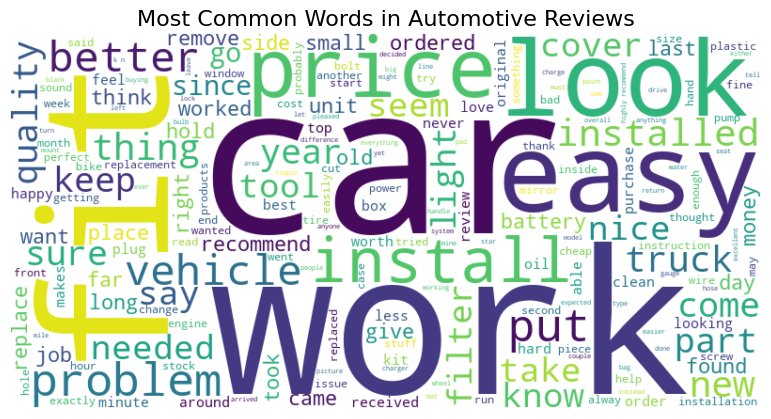

Completed Automotive: 122186 reviews, 8797023 words
Top 10 words: great (34438), car (30866), good (28637), use (25982), like (25084), well (24936), get (22951), fit (22525), easy (19583), time (19072)

Processing Health...


Reading Health: 211388it [00:07, 29365.23it/s]


Word cloud saved to wordclouds/Health_wordcloud.png


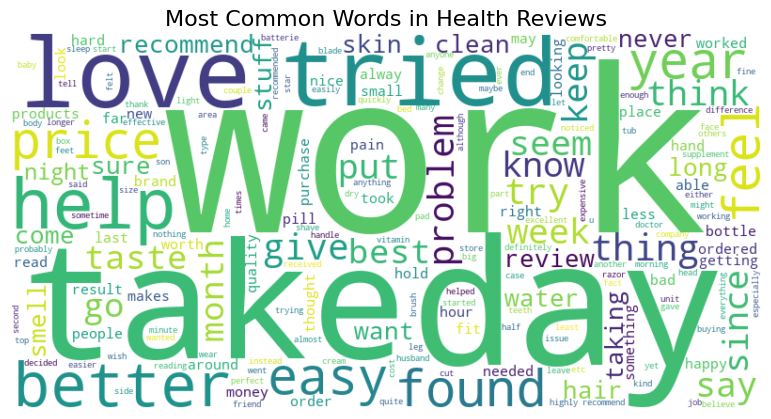

Completed Health: 211387 reviews, 17061225 words
Top 10 words: use (69447), like (59557), great (54331), good (49826), get (48532), well (42981), time (41553), used (41540), really (35850), much (34518)

Processing Watches...


Reading Watches: 22713it [00:00, 28295.21it/s]


Word cloud saved to wordclouds/Watches_wordcloud.png


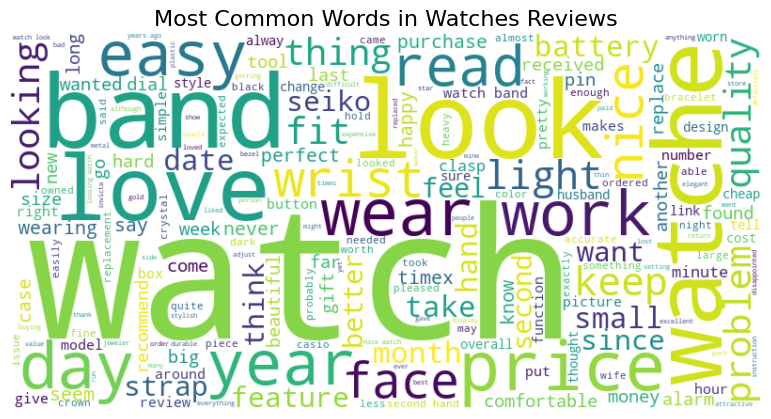

Completed Watches: 22712 reviews, 1828439 words
Top 10 words: watch (48310), time (10478), band (8335), great (7722), like (7040), watches (6825), good (6168), price (5215), looks (4815), years (4465)

Processing Home_&_Kitchen...


Reading Home_&_Kitchen: 409426it [00:14, 29158.50it/s]


Word cloud saved to wordclouds/Home_&_Kitchen_wordcloud.png


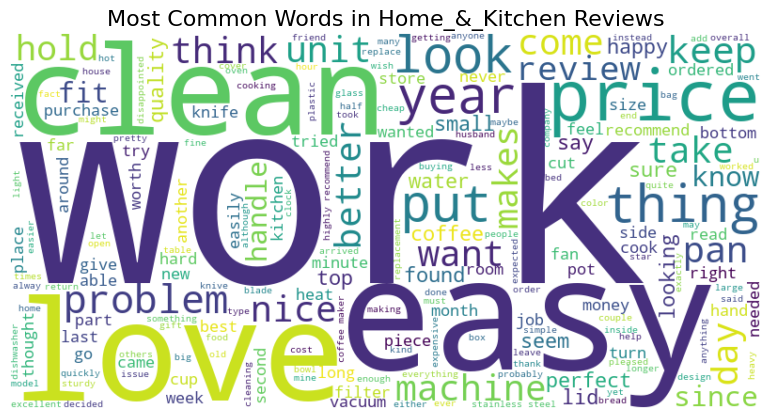

Completed Home_&_Kitchen: 409425 reviews, 34201453 words
Top 10 words: use (140783), great (129027), like (110440), well (98340), good (95610), time (89868), get (83546), easy (81475), coffee (79293), used (68173)

Processing Beauty...


Reading Beauty: 119483it [00:03, 29987.21it/s]


Word cloud saved to wordclouds/Beauty_wordcloud.png


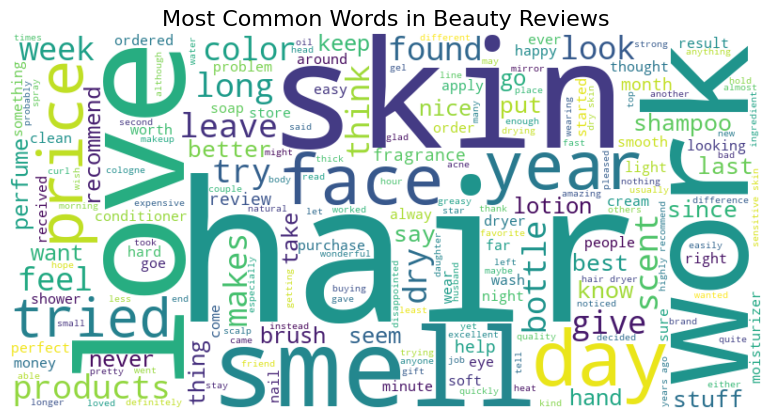

Completed Beauty: 119482 reviews, 9114707 words
Top 10 words: hair (85941), skin (47815), use (45266), like (40721), great (32386), used (29061), using (26828), love (26281), good (25665), really (24531)
Word cloud saved to wordclouds/all_categories_wordcloud.png


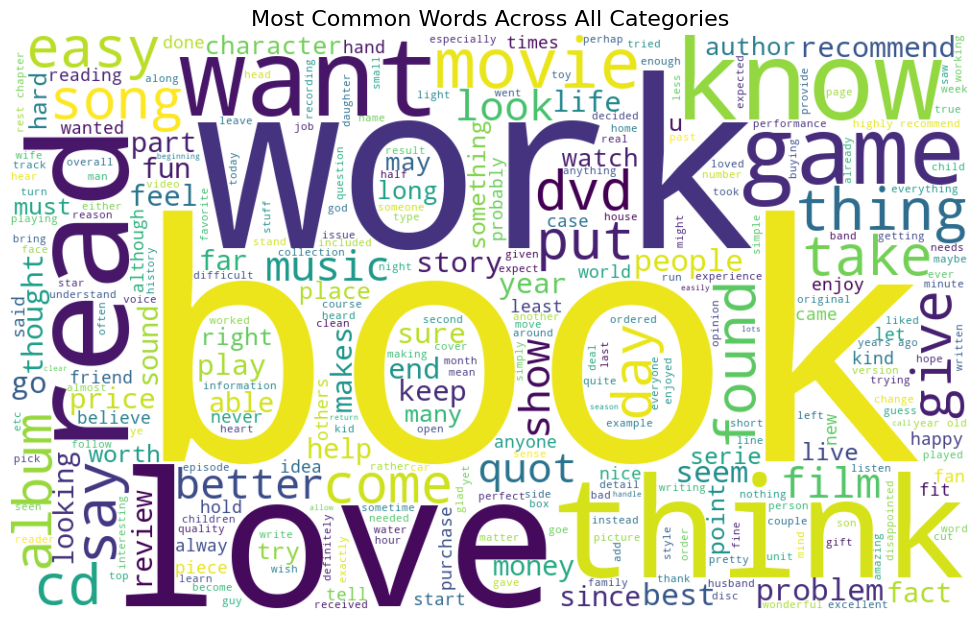

ImportError: cannot import name 'CSVFormatter' from 'pandas.io.formats.csvs' (/Users/justintan/Documents/SIT/Year_2/Cloud/Big_Data_amazon/env/lib/python3.11/site-packages/pandas/io/formats/csvs.py)

In [3]:
import json
import os
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from tqdm import tqdm
import re
from collections import Counter
import nltk
from nltk.corpus import stopwords

# Download NLTK stopwords if not already available
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')

def clean_text(text):
    """Clean and normalize text for word cloud"""
    if not text or pd.isna(text):
        return ""
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)
    
    # Remove special characters, numbers, and extra whitespace
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

def create_word_cloud(text, title, output_file=None, width=800, height=400, max_words=200):
    """Create and save a word cloud from text"""
    # Create additional stopwords specific to Amazon reviews
    custom_stopwords = set(stopwords.words('english'))
    amazon_stopwords = {'amazon', 'product', 'purchased', 'buy', 'bought', 'one', 
                       'would', 'get', 'also', 'use', 'using', 'used', 'good', 
                       'great', 'really', 'much', 'well', 'even', 'like', 'will',
                       'time', 'just', 'make', 'made', 'got', 'little', 'set',
                       'need', 'back', 'could', 'however', 'first', 'still',
                       'item', 'bit', 'lot', 'two', 'without', 'way', 'can', 
                       'every', 'though', 'actually', 'see', 'going', 'find'}
    custom_stopwords.update(amazon_stopwords)
    
    # Generate word cloud
    wordcloud = WordCloud(
        background_color='white',
        stopwords=custom_stopwords,
        max_words=max_words,
        width=width,
        height=height,
        contour_width=3,
        contour_color='steelblue',
        colormap='viridis'
    ).generate(text)
    
    # Plot
    plt.figure(figsize=(width/100, height/100))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=16)
    plt.tight_layout(pad=0)
    
    # Save if output file is provided
    if output_file:
        plt.savefig(output_file, dpi=300, bbox_inches='tight')
        print(f"Word cloud saved to {output_file}")
    
    plt.show()
    
    return wordcloud

def process_all_files(data_dir='../data/filtered_data', output_dir='wordclouds'):
    """
    Automatically processes all JSON files in the specified directory
    and creates word clouds for each file and a combined one.
    """
    print(f"Looking for JSON files in {data_dir}...")
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all JSON files
    json_files = [f for f in os.listdir(data_dir) if f.endswith('.json')]
    
    if not json_files:
        print(f"No JSON files found in {data_dir}")
        return
    
    print(f"Found {len(json_files)} JSON files")
    
    # Process each file
    all_text = []
    category_summaries = []
    
    for json_file in json_files:
        file_path = os.path.join(data_dir, json_file)
        category = json_file.split('.')[0]  # Extract category name
        
        print(f"\nProcessing {category}...")
        
        # Read and process the file
        category_text = []
        review_count = 0
        word_count = 0
        
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                for line in tqdm(f, desc=f"Reading {category}"):
                    try:
                        review = json.loads(line.strip())
                        review_text = review.get('review/text', '')
                        if review_text:
                            cleaned_text = clean_text(review_text)
                            category_text.append(cleaned_text)
                            review_count += 1
                            word_count += len(cleaned_text.split())
                    except json.JSONDecodeError:
                        continue
            
            if not category_text:
                print(f"No text found in {category}")
                continue
            
            # Combine category text
            combined_category_text = ' '.join(category_text)
            all_text.append(combined_category_text)
            
            # Generate word cloud for this category
            output_file = os.path.join(output_dir, f"{category}_wordcloud.png")
            create_word_cloud(combined_category_text, f"Most Common Words in {category} Reviews", output_file)
            
            # Get word frequency for this category
            word_freq = Counter(combined_category_text.split())
            
            # Remove stopwords
            custom_stopwords = set(stopwords.words('english'))
            amazon_stopwords = {'amazon', 'product', 'purchased', 'buy', 'bought', 'one', 'would'}
            custom_stopwords.update(amazon_stopwords)
            
            for word in list(word_freq.keys()):
                if word in custom_stopwords or len(word) < 3:
                    del word_freq[word]
            
            # Get top 10 words
            top_words = word_freq.most_common(10)
            top_words_str = ', '.join([f"{word} ({count})" for word, count in top_words])
            
            # Add to category summaries
            category_summaries.append({
                'category': category,
                'reviews': review_count,
                'words': word_count,
                'top_words': top_words_str
            })
            
            print(f"Completed {category}: {review_count} reviews, {word_count} words")
            print(f"Top 10 words: {top_words_str}")
            
        except Exception as e:
            print(f"Error processing {category}: {str(e)}")
    
    # Create combined word cloud
    if all_text:
        all_combined_text = ' '.join(all_text)
        output_file = os.path.join(output_dir, "all_categories_wordcloud.png")
        create_word_cloud(all_combined_text, "Most Common Words Across All Categories", 
                         output_file, width=1000, height=600, max_words=300)
        
        # Get overall word frequency
        word_freq = Counter(all_combined_text.split())
        
        # Remove stopwords
        custom_stopwords = set(stopwords.words('english'))
        amazon_stopwords = {'amazon', 'product', 'purchased', 'buy', 'bought', 'one', 'would'}
        custom_stopwords.update(amazon_stopwords)
        
        for word in list(word_freq.keys()):
            if word in custom_stopwords or len(word) < 3:
                del word_freq[word]
        
        # Create and save top words report
        top_words_df = pd.DataFrame([{'word': word, 'count': count} 
                                     for word, count in word_freq.most_common(100)])
        top_words_df.to_csv(os.path.join(output_dir, 'top_100_words.csv'), index=False)
        
        # Display top 20
        print("\nTop 20 words across all categories:")
        for word, count in word_freq.most_common(20):
            print(f"{word}: {count}")
    
    # Create and save category summary
    if category_summaries:
        summary_df = pd.DataFrame(category_summaries)
        summary_df.to_csv(os.path.join(output_dir, 'category_word_summary.csv'), index=False)
        print(f"\nCategory summary saved to {os.path.join(output_dir, 'category_word_summary.csv')}")
    
    print("\nWord cloud generation complete!")

# Just run this single function to process everything
process_all_files()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/justintan/nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/justintan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Analyzing sentiment-word associations for Shoes...


Processing Shoes: 3581it [00:01, 2858.31it/s]


Data saved to sentiment_word_analysis/Shoes_top_positive_words.csv
Data saved to sentiment_word_analysis/Shoes_top_negative_words.csv
Data saved to sentiment_word_analysis/Shoes_review_metadata.csv
Data saved to sentiment_word_analysis/Shoes_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Gourmet_Foods...


Processing Gourmet_Foods: 97891it [00:35, 2745.74it/s]


Data saved to sentiment_word_analysis/Gourmet_Foods_top_positive_words.csv
Data saved to sentiment_word_analysis/Gourmet_Foods_top_negative_words.csv
Data saved to sentiment_word_analysis/Gourmet_Foods_review_metadata.csv
Data saved to sentiment_word_analysis/Gourmet_Foods_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Tools_&_Home_Improvement...


Processing Tools_&_Home_Improvement: 231206it [01:35, 2413.57it/s]


Data saved to sentiment_word_analysis/Tools_&_Home_Improvement_top_positive_words.csv
Data saved to sentiment_word_analysis/Tools_&_Home_Improvement_top_negative_words.csv
Data saved to sentiment_word_analysis/Tools_&_Home_Improvement_review_metadata.csv
Data saved to sentiment_word_analysis/Tools_&_Home_Improvement_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Movies_&_TV...


Processing Movies_&_TV: 732723it [08:24, 1452.07it/s]


Data saved to sentiment_word_analysis/Movies_&_TV_top_positive_words.csv
Data saved to sentiment_word_analysis/Movies_&_TV_top_negative_words.csv
Data saved to sentiment_word_analysis/Movies_&_TV_review_metadata.csv
Data saved to sentiment_word_analysis/Movies_&_TV_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Industrial_&_Scientific...


Processing Industrial_&_Scientific: 25506it [00:09, 2716.89it/s]


Data saved to sentiment_word_analysis/Industrial_&_Scientific_top_positive_words.csv
Data saved to sentiment_word_analysis/Industrial_&_Scientific_top_negative_words.csv
Data saved to sentiment_word_analysis/Industrial_&_Scientific_review_metadata.csv
Data saved to sentiment_word_analysis/Industrial_&_Scientific_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Office_Products...


Processing Office_Products: 65053it [00:24, 2666.74it/s]


Data saved to sentiment_word_analysis/Office_Products_top_positive_words.csv
Data saved to sentiment_word_analysis/Office_Products_top_negative_words.csv
Data saved to sentiment_word_analysis/Office_Products_review_metadata.csv
Data saved to sentiment_word_analysis/Office_Products_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Software...


Processing Software: 25999it [00:15, 1713.34it/s]


Data saved to sentiment_word_analysis/Software_top_positive_words.csv
Data saved to sentiment_word_analysis/Software_top_negative_words.csv
Data saved to sentiment_word_analysis/Software_review_metadata.csv
Data saved to sentiment_word_analysis/Software_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Electronics...


Processing Electronics: 340186it [02:23, 2376.11it/s]


Data saved to sentiment_word_analysis/Electronics_top_positive_words.csv
Data saved to sentiment_word_analysis/Electronics_top_negative_words.csv
Data saved to sentiment_word_analysis/Electronics_review_metadata.csv
Data saved to sentiment_word_analysis/Electronics_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Toys_&_Games...


Processing Toys_&_Games: 211452it [01:24, 2488.92it/s]


Data saved to sentiment_word_analysis/Toys_&_Games_top_positive_words.csv
Data saved to sentiment_word_analysis/Toys_&_Games_top_negative_words.csv
Data saved to sentiment_word_analysis/Toys_&_Games_review_metadata.csv
Data saved to sentiment_word_analysis/Toys_&_Games_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Arts...


Processing Arts: 18313it [00:07, 2360.35it/s]


Data saved to sentiment_word_analysis/Arts_top_positive_words.csv
Data saved to sentiment_word_analysis/Arts_top_negative_words.csv
Data saved to sentiment_word_analysis/Arts_review_metadata.csv
Data saved to sentiment_word_analysis/Arts_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Clothing_&_Accessories...


Processing Clothing_&_Accessories: 10758it [00:04, 2415.71it/s]


Data saved to sentiment_word_analysis/Clothing_&_Accessories_top_positive_words.csv
Data saved to sentiment_word_analysis/Clothing_&_Accessories_top_negative_words.csv
Data saved to sentiment_word_analysis/Clothing_&_Accessories_review_metadata.csv
Data saved to sentiment_word_analysis/Clothing_&_Accessories_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Baby...


Processing Baby: 60774it [00:28, 2154.67it/s]


Data saved to sentiment_word_analysis/Baby_top_positive_words.csv
Data saved to sentiment_word_analysis/Baby_top_negative_words.csv
Data saved to sentiment_word_analysis/Baby_review_metadata.csv
Data saved to sentiment_word_analysis/Baby_distinctive_words.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/689453555.py:326: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment_leaning', y='word', data=top_distinctive, palette=colors)


Analyzing sentiment-word associations for Books...


Processing Books: 727164it [08:38, 1402.33it/s]


KeyboardInterrupt: 

In [9]:
import json
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
from tqdm import tqdm
import re
from collections import Counter, defaultdict
from matplotlib.gridspec import GridSpec
import csv

# Download NLTK resources if needed
try:
    nltk.data.find('vader_lexicon')
    nltk.data.find('stopwords')
except LookupError:
    nltk.download('vader_lexicon')
    nltk.download('stopwords')

# Initialize sentiment analyzer
sid = SentimentIntensityAnalyzer()

def save_csv_safely(df, filepath):
    """Save DataFrame to CSV without using pandas to_csv"""
    with open(filepath, 'w', newline='', encoding='utf-8') as f:
        writer = csv.writer(f)
        # Write header
        writer.writerow(df.columns)
        # Write data
        for _, row in df.iterrows():
            writer.writerow(row.values)
    print(f"Data saved to {filepath}")

def clean_text(text):
    """Clean and normalize text"""
    if not text or pd.isna(text):
        return ""
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)
    
    # Remove special characters, numbers, and extra whitespace
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

def count_reviews_in_file(file_path):
    """Count the number of reviews in a JSON file"""
    count = 0
    try:
        with open(file_path, 'r', encoding='utf-8') as f:
            for _ in f:
                count += 1
        return count
    except Exception as e:
        print(f"Error counting reviews in {file_path}: {str(e)}")
        return 0

def analyze_file(file_path, max_reviews=3500):
    """Analyze a single JSON file with a limit on the number of reviews processed"""
    # Extract category name from file path
    category = os.path.basename(file_path).split('.')[0]
    
    # Skip Kindle_Store
    if category == "Kindle_Store":
        print(f"Skipping {category} category due to insufficient data.")
        return None
    
    print(f"Analyzing {category}...")
    
    # Count total reviews in file
    total_reviews = count_reviews_in_file(file_path)
    print(f"Found {total_reviews} reviews in {category}")
    
    # Skip if too few reviews
    if total_reviews < 100:
        print(f"Skipping {category} due to insufficient data (only {total_reviews} reviews)")
        return None
    
    # Initialize data storage
    sentiment_scores = []
    ratings = []
    review_lengths = []
    helpfulness_ratios = []
    positive_words = []
    negative_words = []
    neutral_words = []
    
    # Process the file
    try:
        reviews_processed = 0
        
        with open(file_path, 'r', encoding='utf-8') as f:
            for line in tqdm(f, desc=f"Processing {category}", unit="reviews"):
                if reviews_processed >= max_reviews:
                    break
                    
                try:
                    review = json.loads(line.strip())
                    review_text = review.get('review/text', '')
                    rating = float(review.get('review/score', 0))
                    helpfulness = review.get('review/helpfulness', '0/0')
                    
                    if review_text and rating > 0:
                        # Clean the text
                        cleaned_text = clean_text(review_text)
                        
                        # Get sentiment
                        sentiment = sid.polarity_scores(review_text)
                        compound_score = sentiment['compound']
                        
                        # Store data
                        sentiment_scores.append(compound_score)
                        ratings.append(rating)
                        review_lengths.append(len(review_text))
                        
                        # Process helpfulness
                        try:
                            helpful_votes, total_votes = map(int, helpfulness.split('/'))
                            if total_votes > 0:
                                helpfulness_ratios.append(helpful_votes / total_votes)
                        except:
                            pass
                        
                        # Categorize words by sentiment
                        words = cleaned_text.split()
                        
                        # Filter stopwords
                        stop_words = set(stopwords.words('english'))
                        amazon_stopwords = {'amazon', 'product', 'one', 'would', 'get', 'also', 'use', 'like'}
                        stop_words.update(amazon_stopwords)
                        words = [word for word in words if word not in stop_words and len(word) > 2]
                        
                        if compound_score >= 0.05:
                            positive_words.extend(words)
                        elif compound_score <= -0.05:
                            negative_words.extend(words)
                        else:
                            neutral_words.extend(words)
                        
                        reviews_processed += 1
                        
                except json.JSONDecodeError:
                    continue
        
        print(f"Processed {reviews_processed} reviews for {category}")
        
        # Skip if too few reviews were processed
        if reviews_processed < 100:
            print(f"Skipping {category} due to insufficient valid reviews (only {reviews_processed} processed)")
            return None
            
        # Calculate metrics
        sentiment_df = pd.DataFrame({
            'sentiment_score': sentiment_scores,
            'rating': ratings,
            'review_length': review_lengths
        })
        
        # Add sentiment categories
        sentiment_df['sentiment_category'] = sentiment_df['sentiment_score'].apply(
            lambda x: 'positive' if x >= 0.05 else ('negative' if x <= -0.05 else 'neutral')
        )
        
        # Calculate top words
        positive_counter = Counter(positive_words)
        negative_counter = Counter(negative_words)
        
        # Calculate metrics
        positive_pct = (sentiment_df['sentiment_category'] == 'positive').mean() * 100
        negative_pct = (sentiment_df['sentiment_category'] == 'negative').mean() * 100
        neutral_pct = (sentiment_df['sentiment_category'] == 'neutral').mean() * 100
        
        # Get correlation
        correlation = sentiment_df['sentiment_score'].corr(sentiment_df['rating'])
        
        # Calculate average lengths by sentiment
        avg_lengths = sentiment_df.groupby('sentiment_category')['review_length'].mean().to_dict()
        
        # Get top words
        top_positive = positive_counter.most_common(10)
        top_negative = negative_counter.most_common(10)
        
        # Find distinctive words (words that appear much more in one sentiment than others)
        distinctive_words = []
        all_words = set(positive_counter.keys()) | set(negative_counter.keys())
        
        for word in all_words:
            pos_count = positive_counter.get(word, 0)
            neg_count = negative_counter.get(word, 0)
            total = pos_count + neg_count
            
            if total >= 10:  # Only consider words with reasonable frequency
                pos_ratio = pos_count / total if total > 0 else 0
                leaning = pos_ratio - 0.5  # How much it leans positive or negative
                
                if abs(leaning) >= 0.25:  # Only consider highly distinctive words
                    distinctive_words.append({
                        'word': word,
                        'positive_count': pos_count,
                        'negative_count': neg_count,
                        'total_count': total,
                        'leaning': leaning
                    })
        
        # Sort distinctive words by leaning strength (absolute value)
        distinctive_words.sort(key=lambda x: abs(x['leaning']), reverse=True)
        
        # Prepare results
        result = {
            'category': category,
            'reviews_analyzed': reviews_processed,
            'positive_pct': positive_pct,
            'negative_pct': negative_pct,
            'neutral_pct': neutral_pct,
            'correlation': correlation,
            'avg_review_length': np.mean(review_lengths),
            'avg_positive_length': avg_lengths.get('positive', 0),
            'avg_negative_length': avg_lengths.get('negative', 0),
            'avg_neutral_length': avg_lengths.get('neutral', 0),
            'helpfulness_ratio': np.mean(helpfulness_ratios) if helpfulness_ratios else 0,
            'top_positive_words': dict(top_positive[:5]),
            'top_negative_words': dict(top_negative[:5]),
            'distinctive_words': distinctive_words[:10],
            'sentiment_df': sentiment_df
        }
        
        return result
    
    except Exception as e:
        print(f"Error analyzing {category}: {str(e)}")
        return None

def analyze_all_categories(data_dir, output_dir='cross_category_analysis', max_reviews=3500):
    """Analyze all JSON files and create cross-category comparisons"""
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Find all JSON files
    json_files = [f for f in os.listdir(data_dir) if f.endswith('.json')]
    
    if not json_files:
        print(f"No JSON files found in {data_dir}")
        return
    
    print(f"Found {len(json_files)} JSON files")
    
    # Process each file
    results = []
    
    for json_file in json_files:
        file_path = os.path.join(data_dir, json_file)
        result = analyze_file(file_path, max_reviews=max_reviews)
        if result:
            results.append(result)
    
    if not results:
        print("No results to analyze")
        return
    
    # Create summary DataFrame
    summary_data = []
    
    for result in results:
        summary_data.append({
            'category': result['category'],
            'reviews_analyzed': result['reviews_analyzed'],
            'positive_pct': result['positive_pct'],
            'negative_pct': result['negative_pct'],
            'neutral_pct': result['neutral_pct'],
            'correlation': result['correlation'],
            'avg_review_length': result['avg_review_length'],
            'avg_positive_length': result['avg_positive_length'],
            'avg_negative_length': result['avg_negative_length'],
            'avg_neutral_length': result['avg_neutral_length'],
            'helpfulness_ratio': result['helpfulness_ratio'],
            'top_positive_word': list(result['top_positive_words'].keys())[0] if result['top_positive_words'] else '',
            'top_negative_word': list(result['top_negative_words'].keys())[0] if result['top_negative_words'] else '',
        })
    
    # Create summary DataFrame
    summary_df = pd.DataFrame(summary_data)
    
    # Sort by positive percentage
    summary_df = summary_df.sort_values('positive_pct', ascending=False)
    
    # Print number of categories analyzed
    print(f"Successfully analyzed {len(summary_df)} categories")
    
    # Save summary to CSV safely
    save_csv_safely(summary_df, os.path.join(output_dir, "category_summary.csv"))
    
    # Create visualizations for the report
    create_report_visualizations(results, summary_df, output_dir)
    
    return summary_df, results

def create_report_visualizations(results, summary_df, output_dir):
    """Create visualizations for the report"""
    # 1. Top Categories Table - Create detailed data for top 6 categories
    top_categories = summary_df.head(6).copy()
    top_categories = top_categories[['category', 'reviews_analyzed', 'positive_pct', 'correlation', 'top_positive_word', 'top_negative_word']]
    save_csv_safely(top_categories, os.path.join(output_dir, "top_categories.csv"))
    
    # 2. Sentiment-Rating Correlation Across Categories
    plt.figure(figsize=(12, 10))
    correlation_df = summary_df.sort_values('correlation', ascending=False)
    sns.barplot(x='correlation', y='category', data=correlation_df, palette='viridis')
    plt.title('Sentiment-Rating Correlation by Category', fontsize=14)
    plt.xlabel('Correlation Coefficient', fontsize=12)
    plt.ylabel('Category', fontsize=12)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "sentiment_rating_correlation.png"), dpi=300, bbox_inches='tight')
    plt.close()
    
    # 3. Sentiment Distribution Across Categories (Top 8)
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    axes = axes.flatten()
    
    top8_categories = summary_df.head(8)
    
    for i, (idx, row) in enumerate(top8_categories.iterrows()):
        data = [row['positive_pct'], row['neutral_pct'], row['negative_pct']]
        axes[i].bar(['Positive', 'Neutral', 'Negative'], data, color=['green', 'gray', 'red'])
        axes[i].set_title(row['category'])
        axes[i].set_ylim(0, 100)
        
        # Add text labels
        for j, v in enumerate(data):
            axes[i].text(j, v + 2, f"{v:.1f}%", ha='center')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "sentiment_distribution_top8.png"), dpi=300, bbox_inches='tight')
    plt.close()
    
    # 4. Review Length by Sentiment Category
    plt.figure(figsize=(12, 6))
    
    # Prepare data
    length_data = {
        'category': [],
        'sentiment': [],
        'length': []
    }
    
    for _, row in summary_df.iterrows():
        length_data['category'].extend([row['category']] * 3)
        length_data['sentiment'].extend(['Positive', 'Neutral', 'Negative'])
        length_data['length'].extend([
            row['avg_positive_length'], 
            row['avg_neutral_length'], 
            row['avg_negative_length']
        ])
    
    length_df = pd.DataFrame(length_data)
    
    # Plot
    sns.barplot(x='sentiment', y='length', data=length_df, palette=['green', 'gray', 'red'])
    plt.title('Average Review Length by Sentiment Category (All Categories)', fontsize=14)
    plt.xlabel('Sentiment Category', fontsize=12)
    plt.ylabel('Average Review Length (characters)', fontsize=12)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "review_length_by_sentiment.png"), dpi=300, bbox_inches='tight')
    plt.close()
    
    # 5. Create comprehensive multi-panel figure
    create_multi_panel_figure(results, summary_df, output_dir)
    
    # 6. Find common distinctive words across categories
    find_common_distinctive_words(results, output_dir)

def create_multi_panel_figure(results, summary_df, output_dir):
    """Create a comprehensive multi-panel figure for the report"""
    fig = plt.figure(figsize=(12, 10))
    gs = GridSpec(2, 2, figure=fig)
    
    # Panel A: Sentiment Distribution by Category (Top 6)
    ax1 = fig.add_subplot(gs[0, 0])
    
    # Extract data
    top6 = summary_df.head(6).copy()
    categories = top6['category']
    pos_pct = top6['positive_pct']
    neg_pct = top6['negative_pct']
    neu_pct = top6['neutral_pct']
    
    # Create stacked bar chart
    ax1.barh(categories, pos_pct, color='green', label='Positive')
    ax1.barh(categories, neu_pct, left=pos_pct, color='gray', label='Neutral')
    ax1.barh(categories, neg_pct, left=pos_pct+neu_pct, color='red', label='Negative')
    
    ax1.set_xlim(0, 100)
    ax1.set_title('A. Sentiment Distribution (Top 6 Categories)', fontsize=12)
    ax1.set_xlabel('Percentage', fontsize=10)
    ax1.legend(loc='lower right', fontsize='small')
    
    # Panel B: Correlation Coefficient vs Positive Sentiment
    ax2 = fig.add_subplot(gs[0, 1])
    
    ax2.scatter(summary_df['positive_pct'], summary_df['correlation'], 
               alpha=0.7, s=50, c=range(len(summary_df)), cmap='viridis')
    
    # Add labels for top/bottom 3
    for i, row in summary_df.iloc[:3].iterrows():
        ax2.annotate(row['category'], 
                   (row['positive_pct'], row['correlation']),
                   xytext=(5, 5), textcoords='offset points', fontsize=8)
    
    for i, row in summary_df.iloc[-3:].iterrows():
        ax2.annotate(row['category'], 
                   (row['positive_pct'], row['correlation']),
                   xytext=(5, -10), textcoords='offset points', fontsize=8)
    
    ax2.set_title('B. Rating-Sentiment Correlation vs. Positive %', fontsize=12)
    ax2.set_xlabel('Positive Sentiment %', fontsize=10)
    ax2.set_ylabel('Correlation Coefficient', fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    # Panel C: Review Length Comparison
    ax3 = fig.add_subplot(gs[1, 0])
    
    # Get categories with longest negative reviews
    length_df = summary_df.sort_values('avg_negative_length', ascending=False).head(6)
    
    x = np.arange(len(length_df))
    width = 0.25
    
    ax3.bar(x - width, length_df['avg_positive_length'], width, label='Positive', color='green')
    ax3.bar(x, length_df['avg_neutral_length'], width, label='Neutral', color='gray')
    ax3.bar(x + width, length_df['avg_negative_length'], width, label='Negative', color='red')
    
    ax3.set_xticks(x)
    ax3.set_xticklabels(length_df['category'], rotation=45, ha='right')
    ax3.set_title('C. Review Length by Sentiment (Top 6 Categories)', fontsize=12)
    ax3.set_ylabel('Average Length (chars)', fontsize=10)
    ax3.legend()
    
    # Panel D: Common Words Network (simplified as a bar chart)
    ax4 = fig.add_subplot(gs[1, 1])
    
    # Find most common positive and negative words across categories
    all_pos_words = Counter()
    all_neg_words = Counter()
    
    for result in results:
        for word, count in result['top_positive_words'].items():
            all_pos_words[word] += count
        for word, count in result['top_negative_words'].items():
            all_neg_words[word] += count
    
    # Get top words
    top_pos = [word for word, _ in all_pos_words.most_common(5)]
    top_neg = [word for word, _ in all_neg_words.most_common(5)]
    
    # Create dual axis chart
    x_pos = np.arange(len(top_pos))
    ax4.bar(x_pos, [all_pos_words[word] for word in top_pos], color='green', alpha=0.7, label='Positive')
    ax4.set_title('D. Most Common Words Across Categories', fontsize=12)
    ax4.set_ylabel('Frequency', color='green', fontsize=10)
    ax4.tick_params(axis='y', labelcolor='green')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(top_pos, rotation=45, ha='right')
    
    # Make a twin axis for negative words
    ax4_2 = ax4.twinx()
    x_neg = np.arange(len(top_neg))
    ax4_2.bar([x + len(top_pos) + 0.5 for x in x_neg], [all_neg_words[word] for word in top_neg], color='red', alpha=0.7, label='Negative')
    ax4_2.set_ylabel('Frequency', color='red', fontsize=10)
    ax4_2.tick_params(axis='y', labelcolor='red')
    ax4_2.set_xticks([x + len(top_pos) + 0.5 for x in x_neg])
    ax4_2.set_xticklabels(top_neg, rotation=45, ha='right')
    
    # Create a combined legend
    lines_labels = [ax.get_legend_handles_labels() for ax in [ax4, ax4_2]]
    lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
    ax4.legend(lines, labels, loc='upper center')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "multi_panel_summary.png"), dpi=300, bbox_inches='tight')
    plt.close()

def find_common_distinctive_words(results, output_dir):
    """Find words that are distinctively positive or negative across multiple categories"""
    # Collect distinctive words from all categories
    all_distinctive = defaultdict(list)
    
    for result in results:
        category = result['category']
        for word_info in result['distinctive_words']:
            word = word_info['word']
            leaning = word_info['leaning']
            all_distinctive[word].append({
                'category': category,
                'leaning': leaning
            })
    
    # Find words that appear in multiple categories with consistent sentiment
    common_words = []
    
    for word, appearances in all_distinctive.items():
        if len(appearances) >= 3:  # Word appears in at least 3 categories
            # Check if sentiment is consistent
            leanings = [a['leaning'] for a in appearances]
            avg_leaning = sum(leanings) / len(leanings)
            
            # Only include if sentiment is consistently positive or negative
            if abs(avg_leaning) >= 0.2:
                common_words.append({
                    'word': word,
                    'categories': len(appearances),
                    'avg_leaning': avg_leaning,
                    'sentiment': 'positive' if avg_leaning > 0 else 'negative'
                })
    
    # Sort by number of categories and then by leaning strength
    common_words.sort(key=lambda x: (x['categories'], abs(x['avg_leaning'])), reverse=True)
    
    # Save to CSV
    if common_words:
        common_df = pd.DataFrame(common_words)
        save_csv_safely(common_df, os.path.join(output_dir, "common_distinctive_words.csv"))
        
        # Create visualization
        plt.figure(figsize=(12, 6))
        
        # Split into positive and negative
        pos_words = [w for w in common_words if w['sentiment'] == 'positive'][:10]
        neg_words = [w for w in common_words if w['sentiment'] == 'negative'][:10]
        
        if pos_words:
            plt.subplot(1, 2, 1)
            plt.barh([w['word'] for w in pos_words], 
                   [w['categories'] for w in pos_words], 
                   color='green')
            plt.title('Common Positive Words', fontsize=14)
            plt.xlabel('Number of Categories', fontsize=12)
        
        if neg_words:
            plt.subplot(1, 2, 2)
            plt.barh([w['word'] for w in neg_words], 
                   [w['categories'] for w in neg_words], 
                   color='red')
            plt.title('Common Negative Words', fontsize=14)
            plt.xlabel('Number of Categories', fontsize=12)
        
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, "common_distinctive_words.png"), dpi=300, bbox_inches='tight')
        plt.close()

# To run the analysis:
analyze_all_categories('../data/filtered_data', max_reviews=3500)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/justintan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/justintan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Found 28 JSON files
Analyzing Shoes...
Found 3581 reviews in Shoes


Processing Shoes: 3500reviews [00:01, 2764.87reviews/s]


Processed 3500 reviews for Shoes
Analyzing Gourmet_Foods...
Found 97891 reviews in Gourmet_Foods


Processing Gourmet_Foods: 3500reviews [00:01, 2413.06reviews/s]


Processed 3500 reviews for Gourmet_Foods
Analyzing Tools_&_Home_Improvement...
Found 231206 reviews in Tools_&_Home_Improvement


Processing Tools_&_Home_Improvement: 3500reviews [00:01, 2274.72reviews/s]


Processed 3500 reviews for Tools_&_Home_Improvement
Analyzing Movies_&_TV...
Found 732723 reviews in Movies_&_TV


Processing Movies_&_TV: 3500reviews [00:02, 1469.34reviews/s]


Processed 3500 reviews for Movies_&_TV
Analyzing Industrial_&_Scientific...
Found 25506 reviews in Industrial_&_Scientific


Processing Industrial_&_Scientific: 3500reviews [00:01, 2730.13reviews/s]


Processed 3500 reviews for Industrial_&_Scientific
Analyzing Office_Products...
Found 65053 reviews in Office_Products


Processing Office_Products: 3500reviews [00:01, 2544.67reviews/s]


Processed 3500 reviews for Office_Products
Analyzing Software...
Found 25999 reviews in Software


Processing Software: 3500reviews [00:02, 1631.60reviews/s]


Processed 3500 reviews for Software
Analyzing Electronics...
Found 340186 reviews in Electronics


Processing Electronics: 3500reviews [00:01, 2443.80reviews/s]


Processed 3500 reviews for Electronics
Analyzing Toys_&_Games...
Found 211452 reviews in Toys_&_Games


Processing Toys_&_Games: 3500reviews [00:01, 2415.92reviews/s]


Processed 3500 reviews for Toys_&_Games
Analyzing Arts...
Found 18313 reviews in Arts


Processing Arts: 3500reviews [00:01, 2867.48reviews/s]


Processed 3500 reviews for Arts
Analyzing Clothing_&_Accessories...
Found 10758 reviews in Clothing_&_Accessories


Processing Clothing_&_Accessories: 3500reviews [00:01, 2449.78reviews/s]


Processed 3500 reviews for Clothing_&_Accessories
Analyzing Baby...
Found 60774 reviews in Baby


Processing Baby: 3500reviews [00:01, 2205.96reviews/s]


Processed 3500 reviews for Baby
Analyzing Books...
Found 1126634 reviews in Books


Processing Books: 3500reviews [00:02, 1380.65reviews/s]


Processed 3500 reviews for Books
Analyzing Video_Games...
Found 156810 reviews in Video_Games


Processing Video_Games: 3500reviews [00:02, 1276.41reviews/s]


Processed 3500 reviews for Video_Games
Analyzing Musical_Instruments...
Found 54373 reviews in Musical_Instruments


Processing Musical_Instruments: 3500reviews [00:01, 2293.03reviews/s]


Processed 3500 reviews for Musical_Instruments
Analyzing Music...
Found 689520 reviews in Music


Processing Music: 3500reviews [00:02, 1405.66reviews/s]


Processed 3500 reviews for Music
Analyzing Sports_&_Outdoors...
Found 196970 reviews in Sports_&_Outdoors


Processing Sports_&_Outdoors: 3500reviews [00:01, 2369.10reviews/s]


Processed 3500 reviews for Sports_&_Outdoors
Analyzing Cell_Phones_&_Accessories...
Found 23723 reviews in Cell_Phones_&_Accessories


Processing Cell_Phones_&_Accessories: 3500reviews [00:01, 2901.64reviews/s]


Processed 3500 reviews for Cell_Phones_&_Accessories
Analyzing Amazon_Instant_Video...
Found 102103 reviews in Amazon_Instant_Video


Processing Amazon_Instant_Video: 3500reviews [00:02, 1616.26reviews/s]


Processed 3500 reviews for Amazon_Instant_Video
Analyzing Patio...
Found 115932 reviews in Patio


Processing Patio: 3500reviews [00:01, 2522.26reviews/s]


Processed 3500 reviews for Patio
Analyzing Pet_Supplies...
Found 117584 reviews in Pet_Supplies


Processing Pet_Supplies: 3500reviews [00:01, 2687.74reviews/s]


Processed 3500 reviews for Pet_Supplies
Skipping Kindle_Store category due to insufficient data.
Analyzing Jewelry...
Found 22862 reviews in Jewelry


Processing Jewelry: 3500reviews [00:00, 3753.37reviews/s]


Processed 3500 reviews for Jewelry
Analyzing Automotive...
Found 122187 reviews in Automotive


Processing Automotive: 3500reviews [00:01, 2737.61reviews/s]


Processed 3500 reviews for Automotive
Analyzing Health...
Found 211388 reviews in Health


Processing Health: 3500reviews [00:01, 2555.72reviews/s]


Processed 3500 reviews for Health
Analyzing Watches...
Found 22713 reviews in Watches


Processing Watches: 3500reviews [00:01, 2459.21reviews/s]


Processed 3500 reviews for Watches
Analyzing Home_&_Kitchen...
Found 409426 reviews in Home_&_Kitchen


Processing Home_&_Kitchen: 3500reviews [00:01, 2503.27reviews/s]


Processed 3500 reviews for Home_&_Kitchen
Analyzing Beauty...
Found 119483 reviews in Beauty


Processing Beauty: 3500reviews [00:01, 2795.74reviews/s]
/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/460061814.py:318: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='correlation', y='category', data=correlation_df, palette='viridis')


Processed 3500 reviews for Beauty
Successfully analyzed 27 categories
Data saved to cross_category_analysis/category_summary.csv
Data saved to cross_category_analysis/top_categories.csv


/var/folders/g9/fqm6b51s7dq_fslw71ptw84c0000gn/T/ipykernel_66309/460061814.py:368: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sentiment', y='length', data=length_df, palette=['green', 'gray', 'red'])


Data saved to cross_category_analysis/common_distinctive_words.csv


(                     category  reviews_analyzed  positive_pct  negative_pct  \
 15                      Music              3500     90.571429      7.485714   
 8                Toys_&_Games              3500     89.000000      9.428571   
 21                    Jewelry              3500     87.800000      9.485714   
 25             Home_&_Kitchen              3500     87.028571     10.114286   
 14        Musical_Instruments              3500     86.742857     10.142857   
 1               Gourmet_Foods              3500     86.257143     10.800000   
 26                     Beauty              3500     85.371429     11.857143   
 11                       Baby              3500     85.085714     12.028571   
 24                    Watches              3500     85.057143     11.771429   
 16          Sports_&_Outdoors              3500     84.600000     12.857143   
 12                      Books              3500     84.400000     13.228571   
 3                 Movies_&_TV          